In [32]:
# import random
# random.seed(0)

# import numpy as np
# np.random.seed(0)

# import tensorflow as tf
# tf.random.set_seed(0)

In [1]:
import os
import json
from zipfile import ZipFile
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
os.chdir('..')
print(os.listdir('archive/plantvillage dataset'))

print(len(os.listdir('archive/plantvillage dataset/segmented')))
print(os.listdir('archive/plantvillage dataset/segmented')[:5])

print(len(os.listdir('archive/plantvillage dataset/color')))
print(os.listdir('archive/plantvillage dataset/color')[:5])

print(len(os.listdir('archive/plantvillage dataset/grayscale')))
print(os.listdir('archive/plantvillage dataset/grayscale')[:5])

['color', 'grayscale', 'segmented']
38
['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy']
38
['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy']
38
['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy']


In [3]:
print(len(os.listdir('archive/plantvillage dataset/color/Grape___healthy')))
print(os.listdir('archive/plantvillage dataset/color/Grape___healthy')[:5])

423
['00e00912-bf75-4cf8-8b7d-ad64b73bea5f___Mt.N.V_HL 6067.JPG', '0163a6aa-fbf8-47c5-965f-59b6efe8bfe5___Mt.N.V_HL 6103.JPG', '0294ca65-4c29-44be-af28-501df9f715e8___Mt.N.V_HL 6176.JPG', '02f95acb-5d92-4f2a-b7ec-3af8709ee7c9___Mt.N.V_HL 9078.JPG', '03027791-26bb-4c46-960e-8df76e27042c___Mt.N.V_HL 6070.JPG']


In [4]:
#dataset path
base_dir = 'archive/plantvillage dataset/color'

(256, 256, 3)


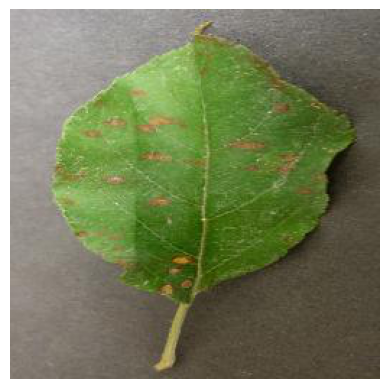

In [5]:
image_path = 'archive/plantvillage dataset/color/Apple___Cedar_apple_rust/025b2b9a-0ec4-4132-96ac-7f2832d0db4a___FREC_C.Rust 3655.JPG'

# Read the image
img = mpimg.imread(image_path)

print(img.shape)
# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis numbers
plt.show()

In [6]:
image_path = 'archive/plantvillage dataset/color/Apple___Cedar_apple_rust/025b2b9a-0ec4-4132-96ac-7f2832d0db4a___FREC_C.Rust 3655.JPG'

# Read the image
img = mpimg.imread(image_path)

print(img)

[[[179 175 176]
  [181 177 178]
  [184 180 181]
  ...
  [115 112 105]
  [108 105  98]
  [101  98  91]]

 [[176 172 173]
  [177 173 174]
  [178 174 175]
  ...
  [113 110 103]
  [111 108 101]
  [109 106  99]]

 [[180 176 177]
  [180 176 177]
  [180 176 177]
  ...
  [108 105  98]
  [111 108 101]
  [114 111 104]]

 ...

 [[137 128 119]
  [131 122 113]
  [125 116 107]
  ...
  [ 74  65  48]
  [ 74  65  48]
  [ 73  64  47]]

 [[136 127 118]
  [132 123 114]
  [128 119 110]
  ...
  [ 77  69  50]
  [ 75  67  48]
  [ 75  67  48]]

 [[133 124 115]
  [133 124 115]
  [132 123 114]
  ...
  [ 81  73  54]
  [ 80  72  53]
  [ 79  71  52]]]


In [7]:
# Image Parameters
img_size = 224
batch_size = 32

# Plot -1

In [8]:
n =len(os.listdir('archive/plantvillage dataset/color'))
type_of_leaves={}
for i in range(n):
  x=os.listdir('archive/plantvillage dataset/color')[i]
  y=x.split('___')[0]
  if y not in type_of_leaves:
    type_of_leaves[y]=1
  else:
    type_of_leaves[y]+=1

all_types = type_of_leaves.keys()
all_types_count = type_of_leaves.values()

In [9]:
print(all_types)
print(all_types_count)

dict_keys(['Apple', 'Blueberry', 'Cherry_(including_sour)', 'Corn_(maize)', 'Grape', 'Orange', 'Peach', 'Pepper,_bell', 'Potato', 'Raspberry', 'Soybean', 'Squash', 'Strawberry', 'Tomato'])
dict_values([4, 1, 2, 4, 4, 1, 2, 2, 3, 1, 1, 1, 2, 10])


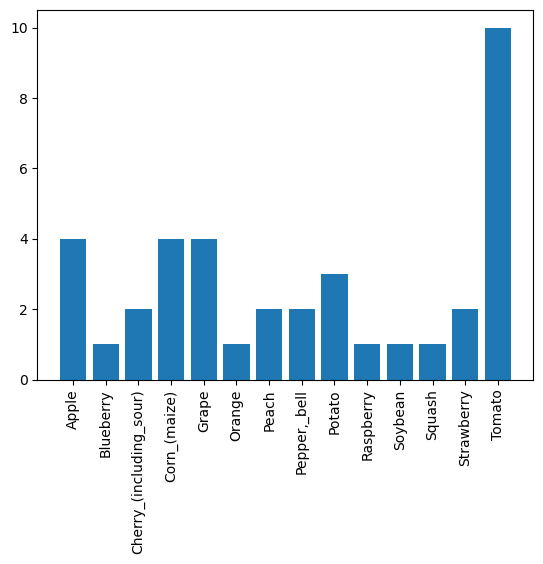

<Figure size 10000x1500 with 0 Axes>

In [11]:
plt.bar(range(len(all_types)),list(all_types_count), align='center')
plt.xticks(range(len(all_types)), list(all_types), rotation=90)
plt.figure(figsize=(100,15))
plt.show()

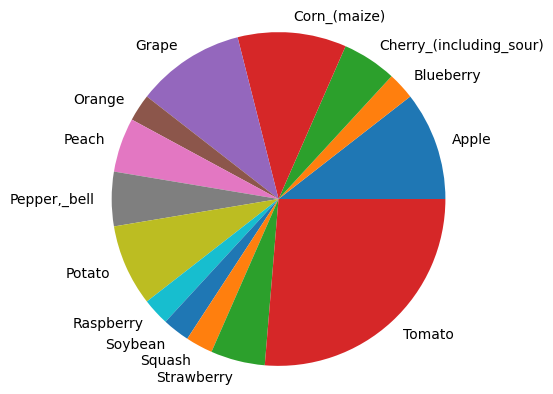

In [12]:
labels = []
sizes = []

for x, y in type_of_leaves.items():
    labels.append(x)
    sizes.append(y)

# Plot
plt.pie(sizes, labels=labels)

plt.axis('equal')
plt.show()

# Plot -2 

In [13]:
n =len(os.listdir('archive/plantvillage dataset/color'))
healthy={'healthy':0, 'ill':0}
a = 'healthy'
b= 'ill'
for i in range(n):
  x=os.listdir('archive/plantvillage dataset/color')[i]
  y=x.split('___')[0]
  if 'healthy' in x:
    healthy[a]+=1
  else:
    healthy[b]+=1

h1 = healthy.keys()
h2 = healthy.values()
print(h1)
print(h2)

dict_keys(['healthy', 'ill'])
dict_values([12, 26])


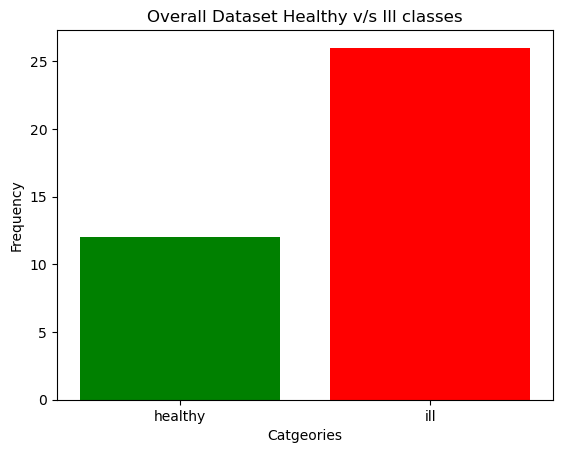

In [14]:
plt.bar(h1, h2, color=('green','red'))
 
# Adding labels and title
plt.xlabel('Catgeories')
plt.ylabel('Frequency')
plt.title('Overall Dataset Healthy v/s Ill classes')
 
# Display the plot
plt.show()

# Plot -3

In [15]:
n =len(os.listdir('archive/plantvillage dataset/color'))
c={}
for i in range(n):
  x=os.listdir('archive/plantvillage dataset/color')[i]
  y=x.split('___')[0]
  if y not in c and 'healthy' in x:
    c[y]={'healthy':1, 'ill':0}
  elif y not in c and 'healthy' not in x:
    c[y]={'healthy':0, 'ill':1}
  elif y in c and 'healthy' in x:
    c[y]['healthy']+=1
  else:
    c[y]['ill']+=1

print(c)

{'Apple': {'healthy': 1, 'ill': 3}, 'Blueberry': {'healthy': 1, 'ill': 0}, 'Cherry_(including_sour)': {'healthy': 1, 'ill': 1}, 'Corn_(maize)': {'healthy': 1, 'ill': 3}, 'Grape': {'healthy': 1, 'ill': 3}, 'Orange': {'healthy': 0, 'ill': 1}, 'Peach': {'healthy': 1, 'ill': 1}, 'Pepper,_bell': {'healthy': 1, 'ill': 1}, 'Potato': {'healthy': 1, 'ill': 2}, 'Raspberry': {'healthy': 1, 'ill': 0}, 'Soybean': {'healthy': 1, 'ill': 0}, 'Squash': {'healthy': 0, 'ill': 1}, 'Strawberry': {'healthy': 1, 'ill': 1}, 'Tomato': {'healthy': 1, 'ill': 9}}


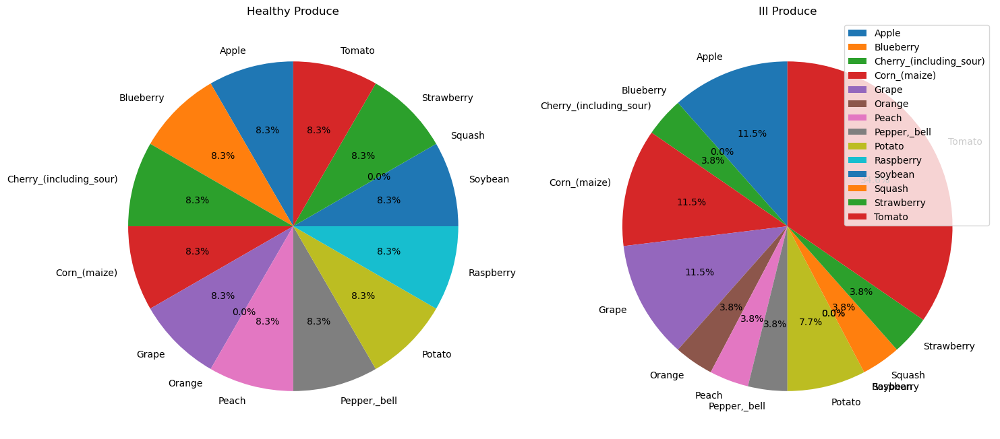

In [20]:
labels = list(c.keys())
healthy_values = [item['healthy'] for item in c.values()]
ill_values = [item['ill'] for item in c.values()]

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))

# Plot the first pie chart (healthy)
ax1.pie(healthy_values, labels=labels, autopct='%1.1f%%', startangle=90)
ax1.set_title('Healthy Produce')

# Plot the second pie chart (ill)
ax2.pie(ill_values, labels=labels, autopct='%1.1f%%', startangle=90)
ax2.set_title('Ill Produce')

# Add a common legend
plt.legend(labels, loc='best')

# Show the plot
plt.tight_layout()
plt.show()

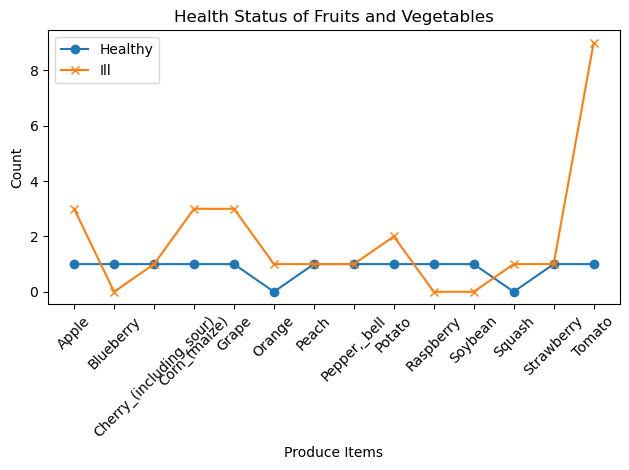

In [17]:
# Extract labels and values
labels = list(c.keys())
healthy_values = [item['healthy'] for item in c.values()]
ill_values = [item['ill'] for item in c.values()]

# Create x-axis positions for each category
x = range(len(labels))

# Plot the healthy line
plt.plot(x, healthy_values, label='Healthy', marker='o')
# Plot the ill line
plt.plot(x, ill_values, label='Ill', marker='x')

# Customize the plot
plt.xlabel('Produce Items')
plt.ylabel('Count')
plt.title('Health Status of Fruits and Vegetables')
plt.xticks(x, labels, rotation=45)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

# Image Samples

In [38]:
base_dir = 'archive/plantvillage dataset/color'
n =len(os.listdir('archive/plantvillage dataset/color'))
classif=[]
img_namess = []
for i in range(n):
    x = os.listdir('archive/plantvillage dataset/color')[i]
    img_namess.append(os.listdir('archive/plantvillage dataset/color/'+x)[0])
    classif.append(x)
print(classif)
print(img_namess)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite',

(256, 256, 3)


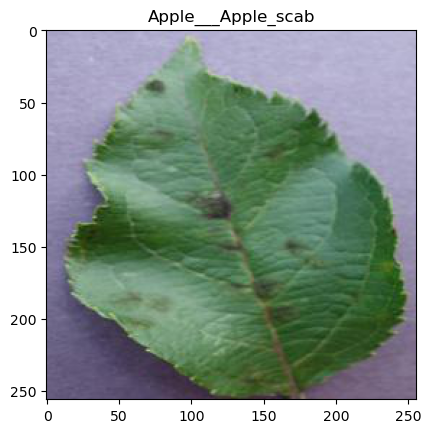

(256, 256, 3)


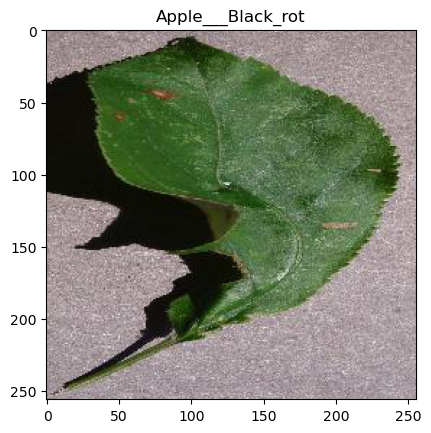

(256, 256, 3)


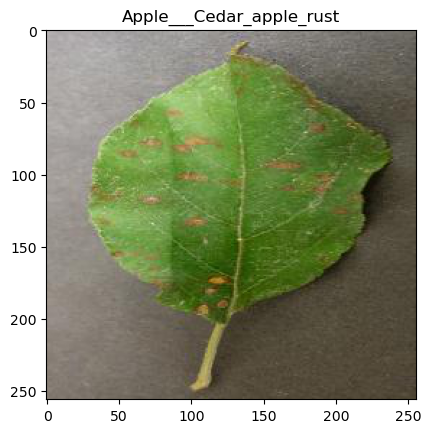

(256, 256, 3)


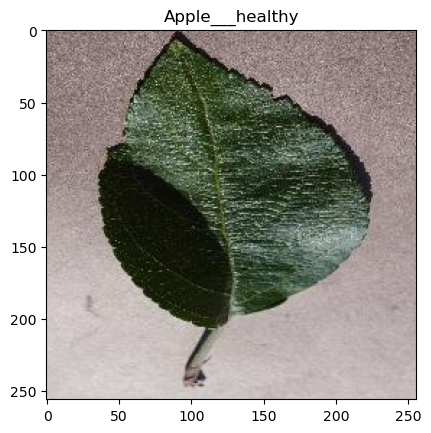

(256, 256, 3)


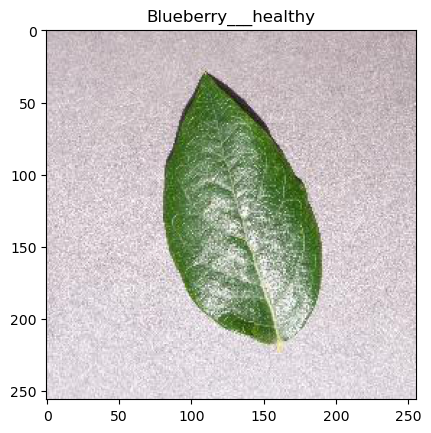

(256, 256, 3)


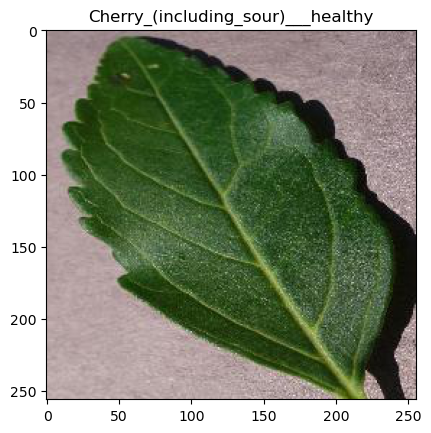

(256, 256, 3)


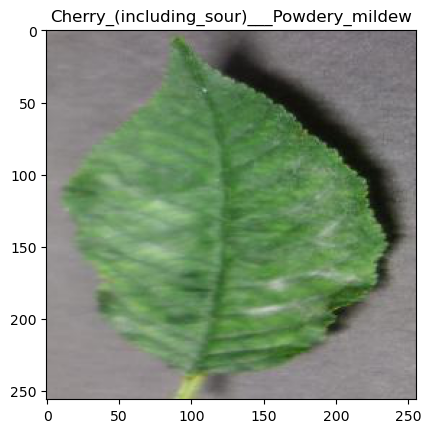

(256, 256, 3)


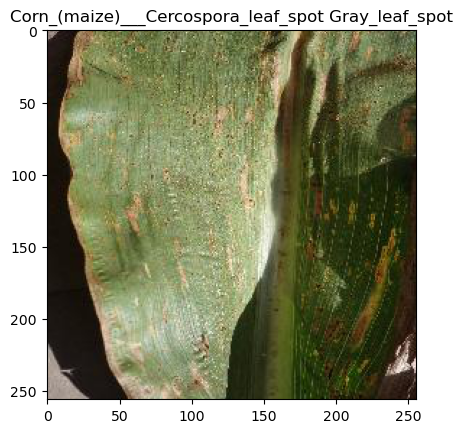

(256, 256, 3)


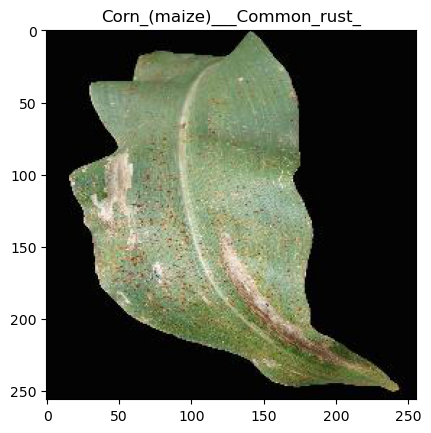

(256, 256, 3)


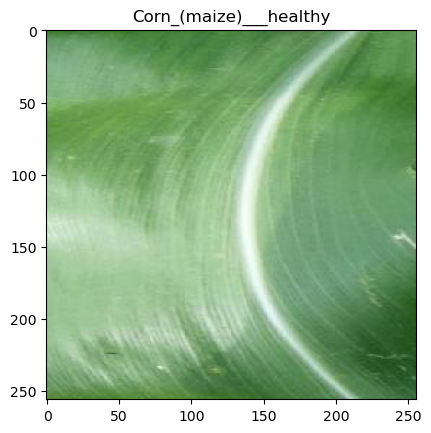

(256, 256, 3)


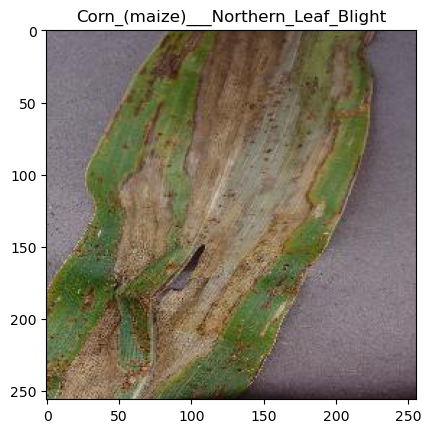

(256, 256, 3)


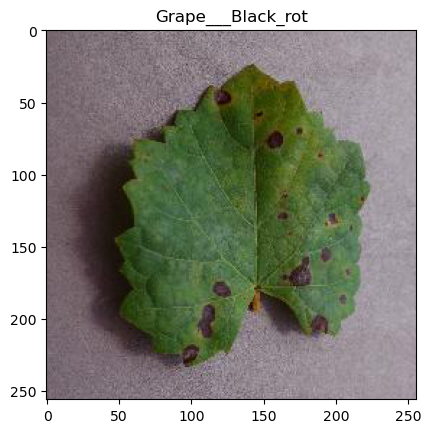

(256, 256, 3)


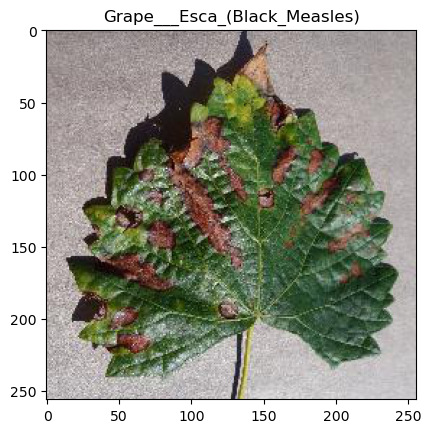

(256, 256, 3)


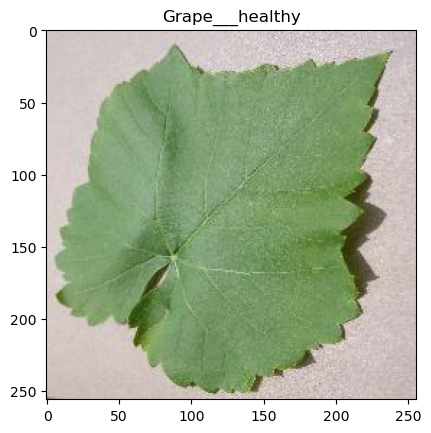

(256, 256, 3)


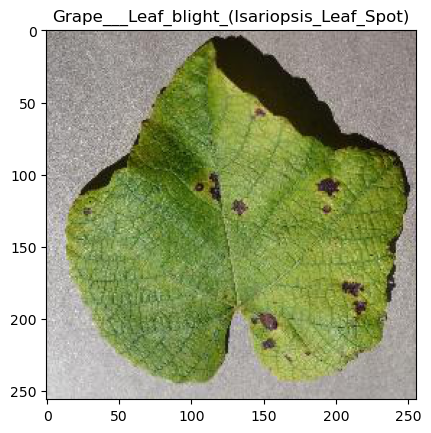

(256, 256, 3)


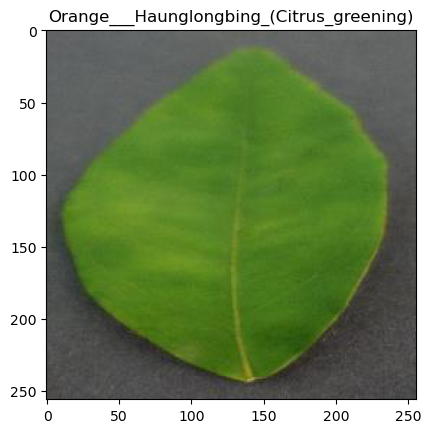

(256, 256, 3)


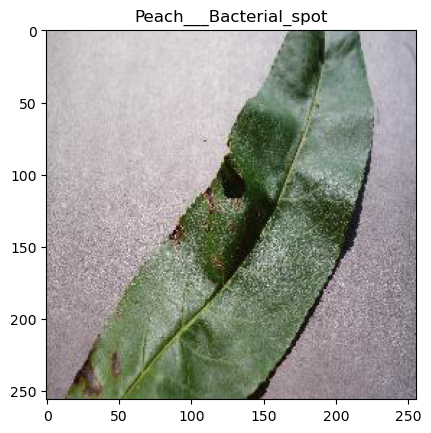

(256, 256, 3)


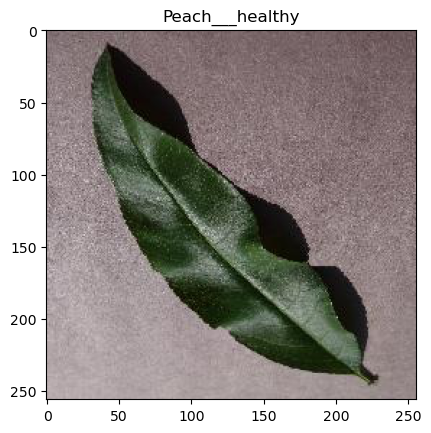

(256, 256, 3)


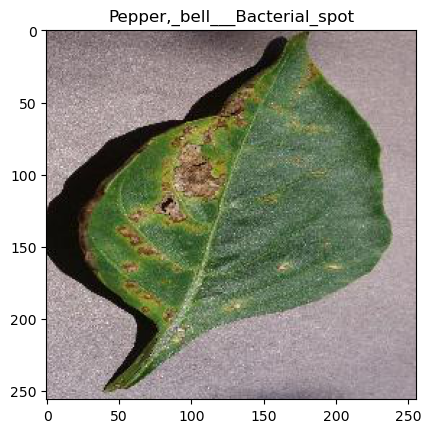

(256, 256, 3)


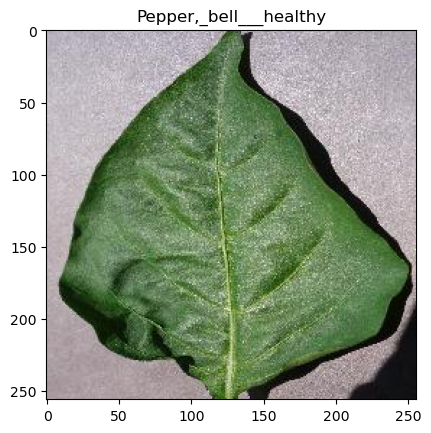

(256, 256, 3)


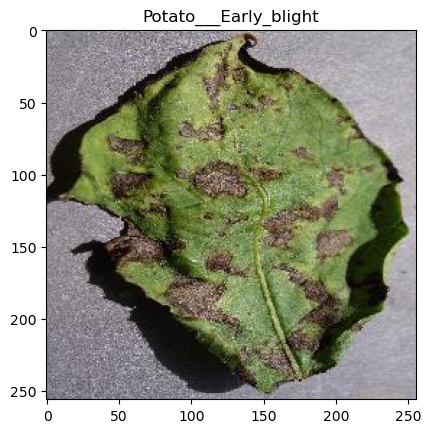

(256, 256, 3)


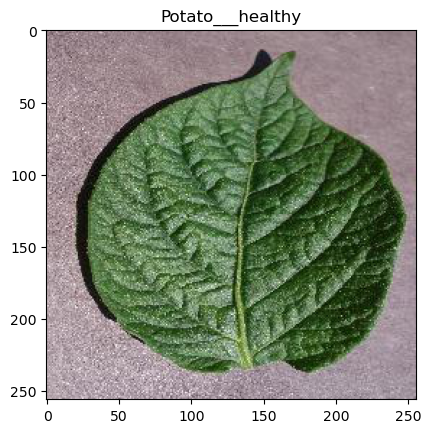

(256, 256, 3)


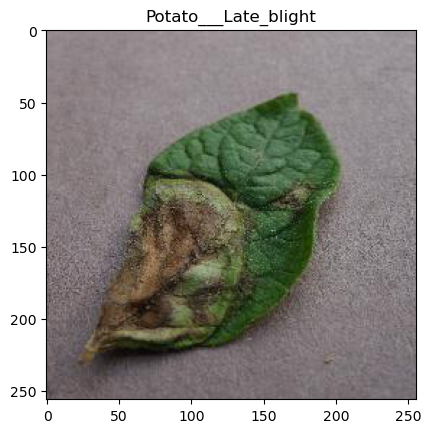

(256, 256, 3)


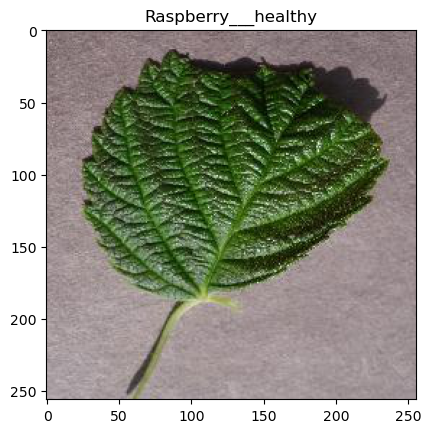

(256, 256, 3)


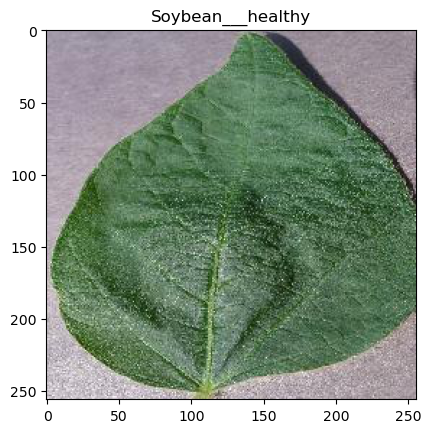

(256, 256, 3)


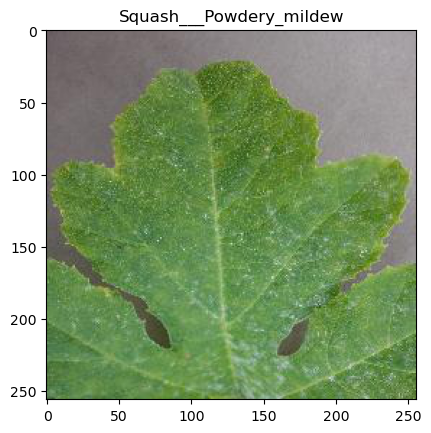

(256, 256, 3)


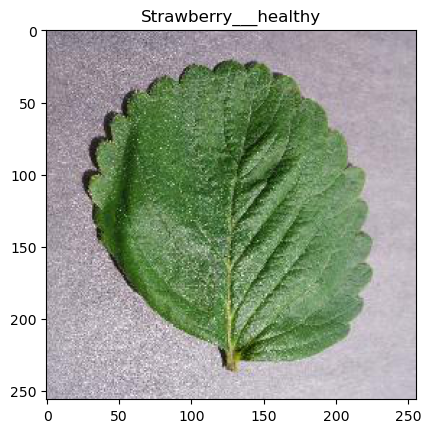

(256, 256, 3)


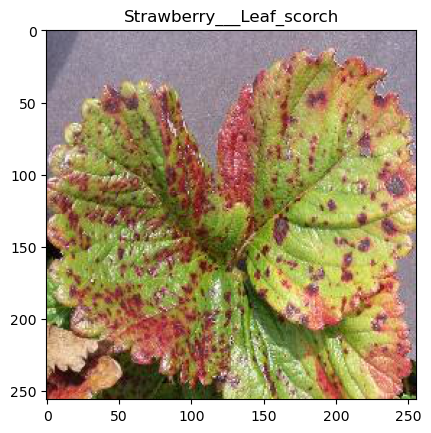

(256, 256, 3)


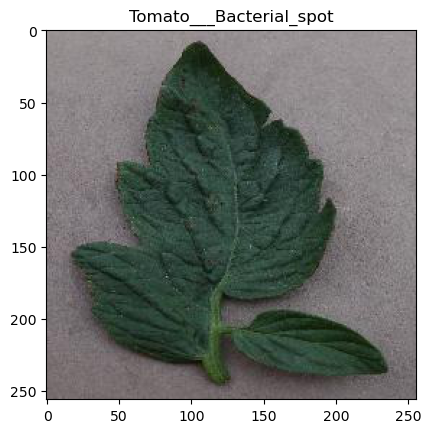

(256, 256, 3)


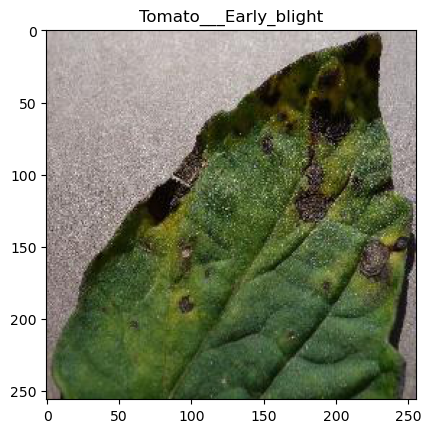

(256, 256, 3)


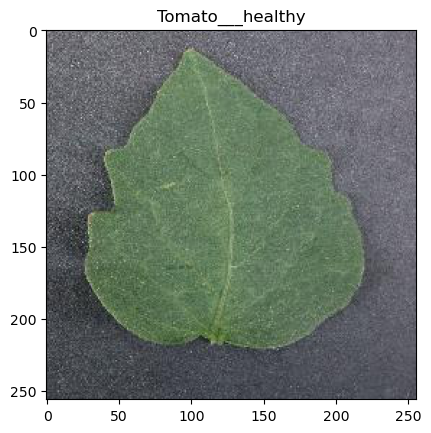

(256, 256, 3)


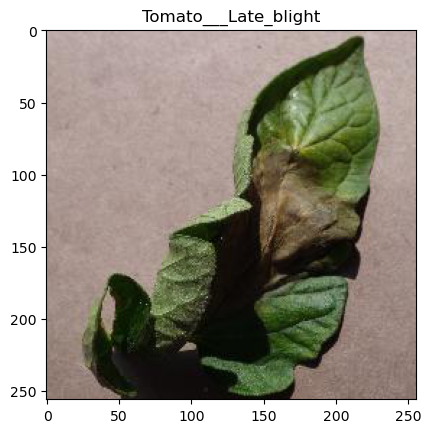

(256, 256, 3)


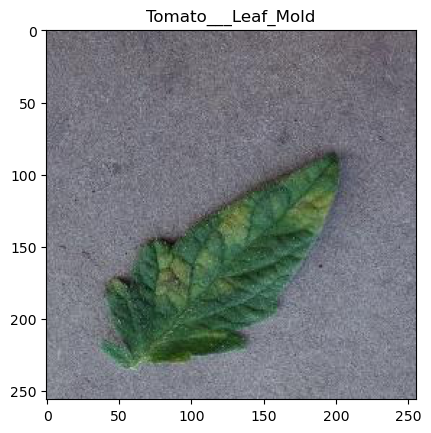

(256, 256, 3)


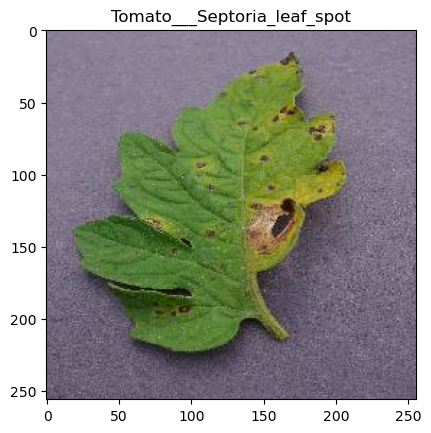

(256, 256, 3)


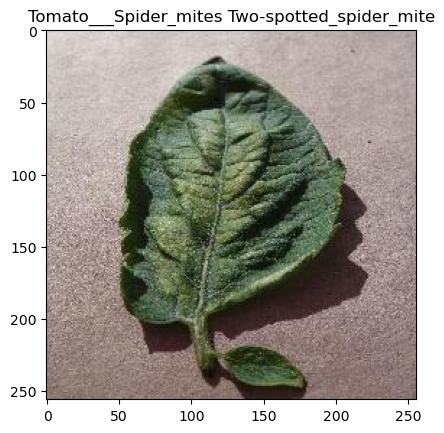

(256, 256, 3)


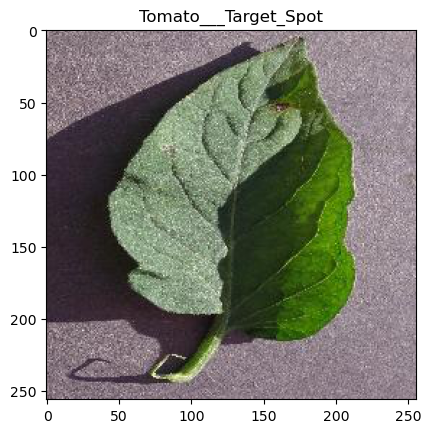

(256, 256, 3)


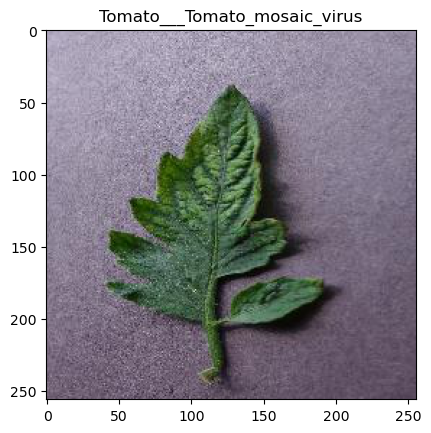

(256, 256, 3)


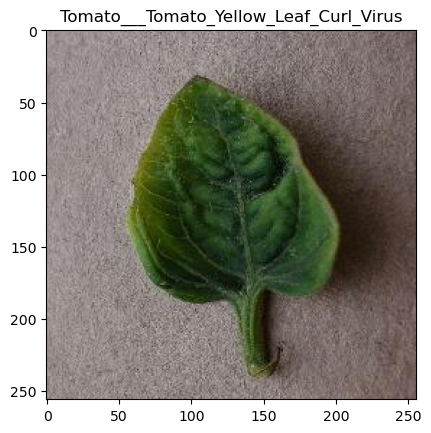

In [43]:
for i in range(n):
    image_path = base_dir+'/'+classif[i]+'/'+img_namess[i]

    # Read the image
    img = mpimg.imread(image_path)

    print(img.shape)
    # Display the image
    plt.imshow(img)
    plt.title(classif[i])
    plt.axis('on')  # Turn off axis numbers
    plt.show()